#1. Connect to GG Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
from pathlib import Path
import os
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from matplotlib import pyplot as plt, image as img
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import (
    Conv2D,
    Conv2DTranspose,
    MaxPool2D,
    ReLU,
    Flatten,
    Dense,
    UpSampling2D,
    Dropout,
)
from tensorflow.keras.models import Model, Sequential
from skimage.transform import resize
from tensorflow import Tensor
from tensorflow.keras.models import Model, Sequential, load_model
from tensorflow.keras import layers
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.layers import Input
from tensorflow import Tensor
from scipy.stats import mannwhitneyu
from tabulate import tabulate

#2. Read the data

## Load thử 1 ảnh

In [ ]:
import cv2
IMG_SIZE = 128

img = cv2.imread("/content/drive/MyDrive/Wibu/Train/COVID/COVID (10).png") 
img = cv2.resize(img, (IMG_SIZE, IMG_SIZE)) 

## Trực quan hóa ảnh

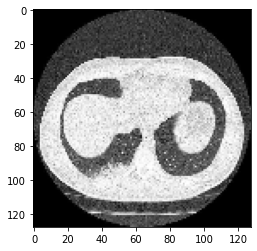

In [ ]:
import matplotlib.pyplot as plt

plt.imshow(img)

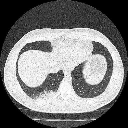

In [ ]:
from google.colab.patches import cv2_imshow
cv2_imshow(img)

In [ ]:
img.shape

(128, 128, 3)

## Load và mã hóa dữ liệu cho mô hình Machine Learning


In [ ]:
import glob
import numpy as np
import cv2

IMG_SIZE = 64

def load_dataset(path):
    X = np.array([])
    y = np.array([])
    classes = ['COVID', 'non-COVID']
    for c in classes:
        files = glob.glob(path + c + "/*.png")
        for f in files:
            
            img = cv2.imread(f) 
            img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
            if X.size == 0:
                X = np.array([img])
            else:
                X = np.vstack([X,[img]])
            y = np.append(y, c)
    return (X,y)

In [ ]:
#Tăng tương phản
gamma = 3
def adjust_gamma(image):
 	# build a lookup table mapping the pixel values [0, 255] to
	# their adjusted gamma values
	  table = np.array([((i / 255.0) ** gamma) * 255
	    for i in np.arange(0, 256)]).astype("uint8")
	# apply gamma correction using the lookup table
	  return cv2.LUT(image, table)
 
def contrast(data):
  X_train_1 = np.array([])
  n=0
  for img in data:
    img_1 = adjust_gamma(img)
    if n == 0:
      X_train_1 = np.array([img_1])
      n+=1
    else:
      X_train_1 = np.vstack([X_train_1,[img_1]])
  return X_train_1

In [ ]:
#X_train, y_train
X, y = load_dataset("/content/drive/MyDrive/Wibu/Train/")

In [ ]:
#X_test, y_test
X_test, y_test = load_dataset("/content/drive/MyDrive/Wibu/Test/")

In [ ]:
X.shape, y.shape, X_test.shape, y_test.shape

((13573, 64, 64, 3), (13573,), (3394, 64, 64, 3), (3394,))

In [ ]:
#Label encoder là một thư viện trong sklearn sẽ giúp mã hoá nhãn (label) về dạng số (numeric)
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
le.fit(y)

LabelEncoder()

In [ ]:
#X5 = contrast(X)
#X6 = contrast(X_test)

In [ ]:
IMG_SIZE = 64

X1 = X.reshape(X.shape[0], IMG_SIZE*IMG_SIZE*3)
X2 = X_test.reshape(X_test.shape[0], IMG_SIZE*IMG_SIZE*3)

In [ ]:
y1 = le.transform(y)
y2 = le.transform(y_test)

In [ ]:
X1.shape, y1.shape, X2.shape, y2.shape

((13573, 12288), (13573,), (3394, 12288), (3394,))

In [ ]:
#from sklearn.decomposition import PCA

In [ ]:
#pca = PCA(n_components=1000)
#pca.fit(X1)

PCA(n_components=1000)

In [ ]:
#X1 = pca.transform(X1)
#X2 = pca.transform(X2)

In [ ]:
#X1.shape, y1.shape, X2.shape, y2.shape

((13573, 1000), (13573,), (3394, 1000), (3394,))

## Load và mã hóa dữ liệu cho mô hình CNN

In [ ]:
def load_raw_data():

    covid_path = "/content/drive/MyDrive/Wibu/Train/COVID/"
    non_covid_path = "/content/drive/MyDrive/Wibu/Train/non-COVID/"

    covid_images = list(Path(covid_path).glob("*.png"))
    non_covid_images = list(Path(non_covid_path).glob("*.png"))

    # To visualize the dataset
    fig = plt.figure(figsize=(10, 10))
    fig.add_subplot(1, 2, 1)
    image = img.imread(covid_images[1])
    plt.imshow(image)
    plt.title("CT Scan of Covid Affected Lungs")

    fig.add_subplot(1, 2, 2)
    image = img.imread(non_covid_images[1])
    plt.imshow(image)
    plt.title("CT Scan of Healthy Lungs")
    return covid_images, non_covid_images

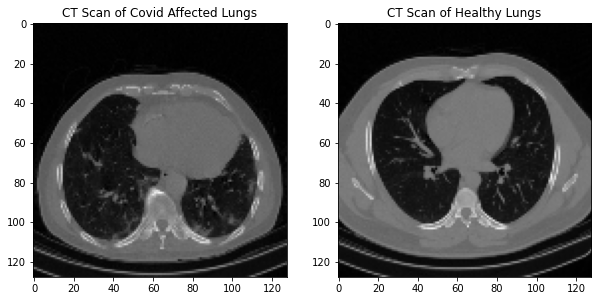

In [ ]:
# To convert .png image files to .npy numpy arrays

covid_images, non_covid_images = load_raw_data()
IMG_SIZE = 128

# Two empty numpy arrays to store coverted images
positive_npy = np.empty((len(covid_images), IMG_SIZE, IMG_SIZE, 1), dtype=np.float32)
negative_npy = np.empty((len(non_covid_images), IMG_SIZE, IMG_SIZE, 1), dtype=np.float32)



In [ ]:
# Converting COVID dataset to .npy format
for i, _file in enumerate(covid_images):
    try:
        image_npy = img.imread(_file)
        positive = resize(image_npy, (IMG_SIZE, IMG_SIZE, 1), anti_aliasing=True)
        positive_npy[i] = positive
    except:
        print("cant open image " + i + "th")
    
print("COVID images converting done")

COVID images converting done


In [ ]:
# Converting non-COVID dataset to .npy format
for i, _file in enumerate(non_covid_images):
    try:
        image_npy = img.imread(_file)
        negative = resize(image_npy, (IMG_SIZE, IMG_SIZE, 1), anti_aliasing=True)
        negative_npy[i] = negative
    except:
        print("cant open image " + i + "th") 
        
    
print("non covid images converting done") 

non covid images converting done


In [ ]:
print(positive_npy.shape)
print(negative_npy.shape)

(7084, 128, 128, 1)
(6489, 128, 128, 1)


In [ ]:
# To load dataset and concat them to x and y
def load_data():
    positive = positive_npy
    positive_labels = ["0" for i in positive]
    negative = negative_npy
    negative_labels = ["1" for i in negative]

    # Joining both datasets and labels
    X = np.concatenate([positive, negative])
    y = np.array((positive_labels + negative_labels), dtype=np.float32)
    return X, y

In [ ]:
#load thư mục train
X3, y3 = load_data()
X3.shape, y3.shape

((13573, 128, 128, 1), (13573,))

In [ ]:
#Load path test
X4, y4 = load_data()
X4.shape, y4.shape

((3394, 128, 128, 1), (3394,))

# Huấn luyện mô hình

## Logistic Regression

In [ ]:
#split train1 dev1
X_train, X_dev, y_train, y_dev = train_test_split(X1, y1, test_size=0.2, random_state=42)

In [ ]:
X_train.shape, y_train.shape, X_dev.shape, y_dev.shape

((10858, 12288), (10858,), (2715, 12288), (2715,))

In [ ]:
from sklearn.linear_model import LogisticRegression
model1 = LogisticRegression(solver='lbfgs', random_state=0)

In [ ]:
model1.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


LogisticRegression(random_state=0)

In [ ]:
model1.score(X_dev, y_dev)

0.8699815837937385

In [ ]:
from sklearn.model_selection import cross_val_score
score1=cross_val_score(LogisticRegression(random_state=0), X1, y1,cv=10)


In [ ]:
np.average(score1)

0.8698883658941853

## KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
# K = 1, tức là với mỗi điểm test data, ta chỉ xét 1 điểm training data gần nhất và lấy label của điểm đó để dự đoán cho điểm test này.
# p là Tham số công suất cho chỉ số Minkowski, euclidean_distance (l2) cho p = 2
# euclidean_distance làgiữa hai điểm trong không gian Euclid là độ dài của đoạn thẳng nối hai điểm đó. Có thể tính nó từ tọa độ Descartes của hai điểm bằng cách sử dụng định lý Pythagoras
model2 = KNeighborsClassifier(n_neighbors=1, p=2, weights='distance')
model2.fit(X_train, y_train)


In [ ]:
model2.score(X_dev, y_dev)

0.9723756906077348

In [ ]:
# creating list of K for KNN
k_list = list(range(1,50,2))
# creating list of cv scores
cv_scores = []

# perform 10-fold cross validation
for k in k_list:
    model2 = KNeighborsClassifier(n_neighbors=k, p=2, weights='distance')
    scores = cross_val_score(model2, X_train, y_train, cv=10, scoring='accuracy')
    cv_scores.append(scores.mean())

<Figure size 432x288 with 0 Axes>

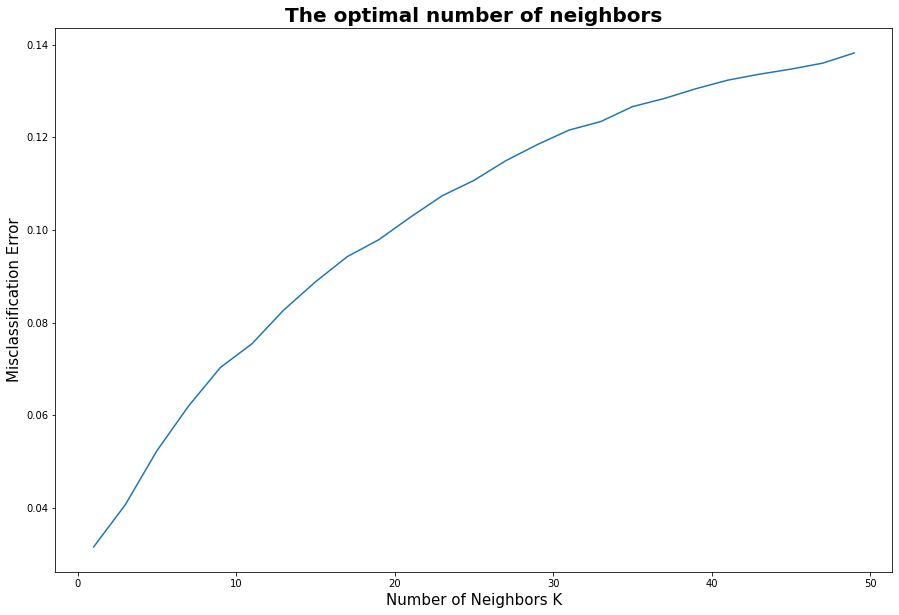

In [ ]:
import seaborn as sns
MSE = [1 - x for x in cv_scores]

plt.figure()
plt.figure(figsize=(15,10))
plt.title('The optimal number of neighbors', fontsize=20, fontweight='bold')
plt.xlabel('Number of Neighbors K', fontsize=15)
plt.ylabel('Misclassification Error', fontsize=15)
sns.set_style("whitegrid")
plt.plot(k_list, MSE)

plt.show()

In [ ]:
score2=cross_val_score(KNeighborsClassifier(n_neighbors=1, p=2, weights='distance'), X1, y1,cv=10)
np.average(score2)

0.9727395612994532

## RFC

In [ ]:
from sklearn.ensemble import RandomForestClassifier
model3 = RandomForestClassifier(n_estimators=100, max_depth=100, random_state=0)
model3.fit(X_train, y_train)

RandomForestClassifier(max_depth=100, random_state=0)

In [ ]:
model3.score(X_dev, y_dev)

0.9429097605893186

In [ ]:
score3=cross_val_score(RandomForestClassifier(n_estimators=100, max_depth=100, random_state=0), X1, y1,cv=10)
np.average(score3)

0.9460694723155882

## CNN

In [ ]:
#Sequential: mô hình tuần tự
# Conv2D layer: (filter, kernel_size: Tham số này xác định kích thước của hạt nhân)
# Relu: ReLU đang được sử dụng khá nhiều trong những năm gần đây khi huấn luyện các mạng neuron. ReLU đơn giản lọc các giá trị < 0. 
# Nhìn vào công thức chúng ta dễ dàng hiểu được cách hoạt động của nó. Một số ưu điểm khá vượt trội của nó so với Sigmoid
# Dense layer hay Fully-connected layer là một lớp cổ điển trong mạng nơ ron nhân tạo. Mỗi nơ ron nhận đầu vào từ tất cả nơ ron lớp trước đó.
# hàm softmax sẽ tính khả năng xuất hiện của một class trong tổng số tất cả các class có thể xuất hiện. Sau đó, xác suất này sẽ được sử dụng để xác định class mục tiêu cho các input. 
#Flatten là một loại hoạt động reshape cụ thể trong đó tất cả các axes được làm phẳng ( smooshed) hoặc ghép lại (squashed ) với nhau.


In [ ]:
def cnn():
    model = Sequential()
    # convulutional layer
    model.add(
        Conv2D(
            32,
            kernel_size=5,
            activation="relu",
            input_shape=(128, 128, 1),
        )
    )
    # Normalising after activation
    model.add(BatchNormalization())    
    model.add(MaxPool2D(pool_size=(2, 2)))
    model.add(Conv2D(64, kernel_size=5, activation="relu"))
   

    model.add(BatchNormalization())
    model.add(MaxPool2D(pool_size=(2, 2)))
    model.add(Conv2D(128, kernel_size=5, activation="relu"))

    
    model.add(BatchNormalization())
    model.add(MaxPool2D(pool_size=(2, 2)))
    model.add(Conv2D(256, kernel_size=5, activation="relu"))

    
    model.add(BatchNormalization())
    model.add(MaxPool2D(pool_size=(2, 2)))
    model.add(Flatten())
    # fully connected layer
    model.add(Dense(200, activation="relu"))
   
    # output
    model.add(Dense(2, activation="softmax"))
    model.compile(
        loss=keras.losses.sparse_categorical_crossentropy,
        optimizer= keras.optimizers.Adam(lr=0.002, beta_1=0.9, beta_2=0.999, epsilon=0.1, decay=0.0),
        metrics=["accuracy"],
    )
    return model

In [ ]:
X_train1, X_dev1, y_train1, y_dev1 = train_test_split(X3, y3, test_size=0.2, random_state=42)
model = cnn()

model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_21 (Conv2D)          (None, 124, 124, 32)      832       
                                                                 
 batch_normalization_19 (Bat  (None, 124, 124, 32)     128       
 chNormalization)                                                
                                                                 
 max_pooling2d_19 (MaxPoolin  (None, 62, 62, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_22 (Conv2D)          (None, 58, 58, 64)        51264     
                                                                 
 batch_normalization_20 (Bat  (None, 58, 58, 64)       256       
 chNormalization)                                                
                                                      

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


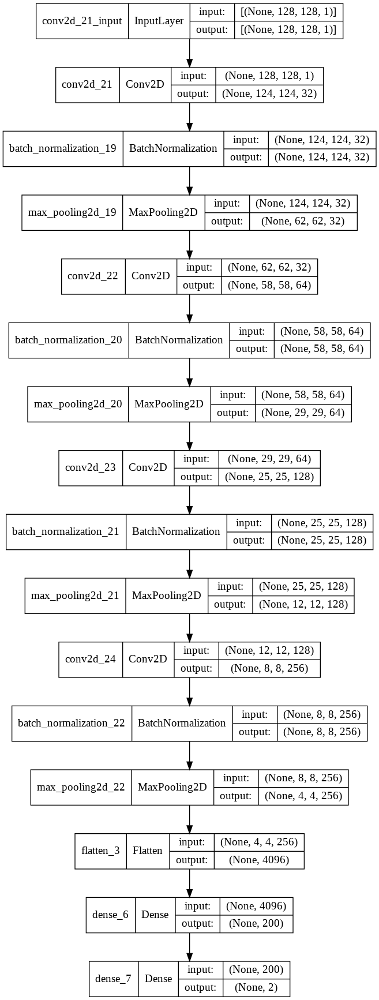

In [ ]:
from tensorflow.keras.utils import plot_model
from IPython.display import Image
plot_model(model, to_file='convnet.png', show_shapes=True,show_layer_names=True)
Image(filename='convnet.png') 

In [ ]:
X_train1.shape, y_train1.shape, X_dev1.shape

((10858, 128, 128, 1), (10858,), (2715, 128, 128, 1))

# Dự đoán kết quả trên tập DEV

## Logistic Regression

In [ ]:
#LogisticRegression
y_pred1 = model1.predict(X_dev)

In [ ]:
y_dev

array([0, 1, 1, ..., 0, 1, 0])

In [ ]:
y_pred1

array([0, 1, 1, ..., 0, 1, 0])

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report

print("Accuracy: {}".format(accuracy_score(y_dev, y_pred1)))
print("Precision: ",str(precision_score(y_dev, y_pred1)))
print("Recall: " + str(recall_score(y_dev, y_pred1)))
print("F1-micro: " + str(f1_score(y_dev, y_pred1, average='micro')))
print("F1-macro: " + str(f1_score(y_dev, y_pred1, average='macro')))

cf = confusion_matrix(y_dev, y_pred1)
cr = classification_report(y_dev, y_pred1)

Accuracy: 0.8699815837937385
Precision:  0.8675548589341693
Recall: 0.8574748257164988
F1-micro: 0.8699815837937385
F1-macro: 0.8695940754254713


In [ ]:
print(cr)

              precision    recall  f1-score   support

           0       0.87      0.88      0.88      1424
           1       0.87      0.86      0.86      1291

    accuracy                           0.87      2715
   macro avg       0.87      0.87      0.87      2715
weighted avg       0.87      0.87      0.87      2715



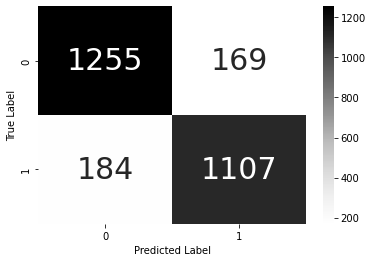

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sn

sn.heatmap(cf, annot=True, cmap="Greys",fmt='g', cbar=True, annot_kws={"size": 30})
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

In [ ]:
model1.fit(X1, y1)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


LogisticRegression(random_state=0)

## KNN

In [ ]:
y_pred2 = model2.predict(X_dev)

In [ ]:
y_dev

array([0, 1, 1, ..., 0, 1, 0])

In [ ]:
y_pred2

array([1, 1, 1, ..., 0, 1, 0])

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report

print("Accuracy: {}".format(accuracy_score(y_dev, y_pred2)))
print("Precision: ",str(precision_score(y_dev, y_pred2)))
print("Recall: " + str(recall_score(y_dev, y_pred2)))
print("F1-micro: " + str(f1_score(y_dev, y_pred2, average='micro')))
print("F1-macro: " + str(f1_score(y_dev, y_pred2, average='macro')))

cf = confusion_matrix(y_dev, y_pred2)
cr = classification_report(y_dev, y_pred2)

Accuracy: 0.9723756906077348
Precision:  0.9698608964451314
Recall: 0.9721146398140976
F1-micro: 0.9723756906077348
F1-macro: 0.9723122108419195


In [ ]:
print(cr)

              precision    recall  f1-score   support

           0       0.97      0.97      0.97      1424
           1       0.97      0.97      0.97      1291

    accuracy                           0.97      2715
   macro avg       0.97      0.97      0.97      2715
weighted avg       0.97      0.97      0.97      2715



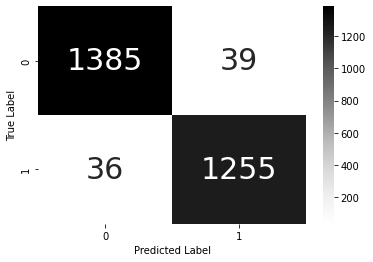

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sn

sn.heatmap(cf, annot=True, cmap="Greys",fmt='g', cbar=True, annot_kws={"size": 30})
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

In [ ]:
model2.fit(X1, y1)

KNeighborsClassifier(n_neighbors=1, weights='distance')

In [ ]:
from joblib import dump
dump(model2, '/content/drive/MyDrive/Wibu/KNN.joblib')

['/content/drive/MyDrive/Wibu/KNN.joblib']

## RFC

In [ ]:
y_pred3 = model3.predict(X_dev)

In [ ]:
y_pred3

array([0, 1, 1, ..., 0, 1, 0])

In [ ]:
y_dev

array([0, 1, 1, ..., 0, 1, 0])

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report

print("Accuracy: {}".format(accuracy_score(y_dev, y_pred3)))
print("Precision: ",str(precision_score(y_dev, y_pred3)))
print("Recall: " + str(recall_score(y_dev, y_pred3)))
print("F1-micro: " + str(f1_score(y_dev, y_pred3, average='micro')))
print("F1-macro: " + str(f1_score(y_dev, y_pred3, average='macro')))

cf = confusion_matrix(y_dev, y_pred3)
cr = classification_report(y_dev, y_pred3)

Accuracy: 0.9429097605893186
Precision:  0.9257871064467766
Recall: 0.9566227730441518
F1-micro: 0.9429097605893186
F1-macro: 0.942846956964604


In [ ]:
print(cr)

              precision    recall  f1-score   support

           0       0.96      0.93      0.94      1424
           1       0.93      0.96      0.94      1291

    accuracy                           0.94      2715
   macro avg       0.94      0.94      0.94      2715
weighted avg       0.94      0.94      0.94      2715



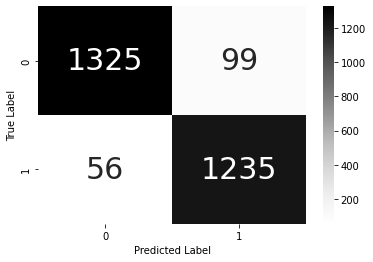

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sn

sn.heatmap(cf, annot=True, cmap="Greys",fmt='g', cbar=True, annot_kws={"size": 30})
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

In [ ]:
model3.fit(X1, y1)

RandomForestClassifier(max_depth=100, random_state=0)

In [ ]:
model3.save

## CNN

In [ ]:
history_cnn = model.fit(
    X_train1,
    y_train1,
    epochs=20,
    workers=4,
    validation_data=(X_dev1, y_dev1),
)

Epoch 1/20
340/340 [==============================] - 21s 60ms/step - loss: 0.4174 - accuracy: 0.8278 - val_loss: 1.6171 - val_accuracy: 0.4759
Epoch 2/20
340/340 [==============================] - 20s 59ms/step - loss: 0.2614 - accuracy: 0.8931 - val_loss: 0.2697 - val_accuracy: 0.8855
Epoch 3/20
340/340 [==============================] - 20s 59ms/step - loss: 0.1865 - accuracy: 0.9248 - val_loss: 0.1721 - val_accuracy: 0.9293
Epoch 4/20
340/340 [==============================] - 20s 59ms/step - loss: 0.1409 - accuracy: 0.9453 - val_loss: 0.2031 - val_accuracy: 0.9263
Epoch 5/20
340/340 [==============================] - 20s 60ms/step - loss: 0.1186 - accuracy: 0.9538 - val_loss: 0.2174 - val_accuracy: 0.9123
Epoch 6/20
340/340 [==============================] - 21s 62ms/step - loss: 0.0596 - accuracy: 0.9790 - val_loss: 0.1787 - val_accuracy: 0.9337
Epoch 7/20
340/340 [==============================] - 20s 59ms/step - loss: 0.0424 - accuracy: 0.9843 - val_loss: 0.1602 - val_accuracy:

In [ ]:
y_pred4 = model.predict(X_dev1)
predicted = np.argmax(y_pred4, axis=-1)
accuracy = np.equal(y_dev1, predicted).mean()
print("Accuracy:", accuracy)

Accuracy: 0.9716390423572744


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_dev1, predicted))

              precision    recall  f1-score   support

         0.0       0.97      0.97      0.97      1424
         1.0       0.97      0.97      0.97      1291

    accuracy                           0.97      2715
   macro avg       0.97      0.97      0.97      2715
weighted avg       0.97      0.97      0.97      2715



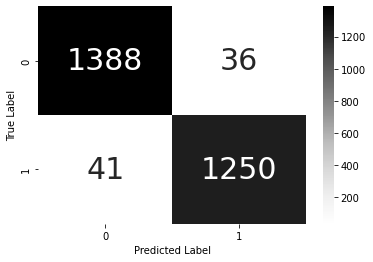

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sn
cf = confusion_matrix(y_dev1, predicted)
sn.heatmap(cf, annot=True, cmap="Greys",fmt='g', cbar=True, annot_kws={"size": 30})
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

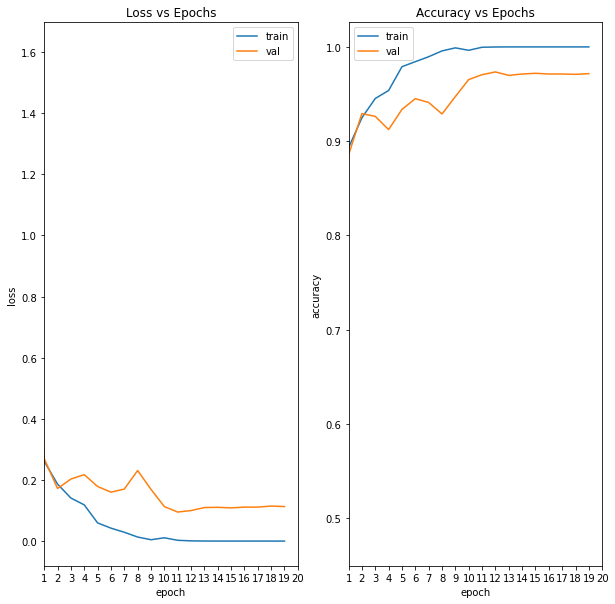

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(10, 10))
ax[0].set_title("Loss vs Epochs")
ax[0].plot(history_cnn.history["loss"])
ax[0].plot(history_cnn.history["val_loss"])
ax[0].legend(["train", "val"])
ax[0].set_xlabel("epoch")
ax[0].set_ylabel("loss")
ax[0].set_xlim(1, 20)
ax[0].set_xticks(range(1, 21))

ax[1].set_title("Accuracy vs Epochs")
ax[1].plot(history_cnn.history["accuracy"])
ax[1].plot(history_cnn.history["val_accuracy"])
ax[1].legend(["train", "val"])
ax[1].set_xlabel("epoch")
ax[1].set_ylabel("accuracy")
ax[1].set_xlim(1, 20)
ax[1].set_xticks(range(1, 21))

plt.show()

In [ ]:
model.fit(X3, y3,epochs=20, workers=4)

Epoch 1/20
425/425 [==============================] - 23s 55ms/step - loss: 0.0906 - accuracy: 0.9716
Epoch 2/20
425/425 [==============================] - 23s 55ms/step - loss: 0.0259 - accuracy: 0.9908
Epoch 3/20
425/425 [==============================] - 23s 54ms/step - loss: 0.0057 - accuracy: 0.9985
Epoch 4/20
425/425 [==============================] - 23s 54ms/step - loss: 0.0033 - accuracy: 0.9990
Epoch 5/20
425/425 [==============================] - 23s 54ms/step - loss: 7.3621e-04 - accuracy: 1.0000
Epoch 6/20
425/425 [==============================] - 23s 54ms/step - loss: 2.6501e-04 - accuracy: 1.0000
Epoch 7/20
425/425 [==============================] - 23s 54ms/step - loss: 1.8337e-04 - accuracy: 1.0000
Epoch 8/20
425/425 [==============================] - 23s 54ms/step - loss: 1.2777e-04 - accuracy: 1.0000
Epoch 9/20
425/425 [==============================] - 23s 54ms/step - loss: 1.2096e-04 - accuracy: 1.0000
Epoch 10/20
425/425 [==============================] - 23s 54m

In [ ]:
model.save('/content/drive/MyDrive/Wibu/CNN.h5')

 # Dự đoán kết quả trên tập Test

## Logistic Regression

In [ ]:
y_pred1 = model1.predict(X2)

In [ ]:
y2

array([0, 0, 0, ..., 1, 1, 1])

In [ ]:
y_pred1

array([0, 0, 0, ..., 1, 1, 1])

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report

print("Accuracy: {}".format(accuracy_score(y2, y_pred1)))
print("Precision: ",str(precision_score(y2, y_pred1)))
print("Recall: " + str(recall_score(y2, y_pred1)))
print("F1-micro: " + str(f1_score(y2, y_pred1, average='micro')))
print("F1-macro: " + str(f1_score(y2, y_pred1, average='macro')))

cf = confusion_matrix(y2, y_pred1)
cr = classification_report(y2, y_pred1)

Accuracy: 0.863877430760165
Precision:  0.8563603164942178
Recall: 0.8616044090630741
F1-micro: 0.863877430760165
F1-macro: 0.8637126920156533


In [ ]:
print(cr)

              precision    recall  f1-score   support

           0       0.87      0.87      0.87      1761
           1       0.86      0.86      0.86      1633

    accuracy                           0.86      3394
   macro avg       0.86      0.86      0.86      3394
weighted avg       0.86      0.86      0.86      3394



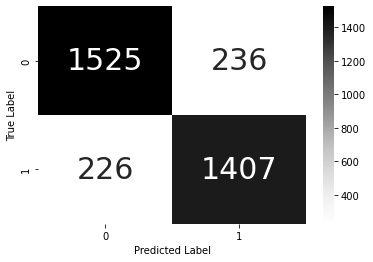

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sn

sn.heatmap(cf, annot=True, cmap="Greys",fmt='g', cbar=True, annot_kws={"size": 30})
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

## KNN

In [ ]:
y_pred2 = model2.predict(X2)

In [ ]:
y2

array([0, 0, 0, ..., 1, 1, 1])

In [ ]:
y_pred2

array([0, 0, 0, ..., 1, 1, 1])

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report

print("Accuracy: {}".format(accuracy_score(y2, y_pred2)))
print("Precision: ",str(precision_score(y2, y_pred2)))
print("Recall: " + str(recall_score(y2, y_pred2)))
print("F1-micro: " + str(f1_score(y2, y_pred2, average='micro')))
print("F1-macro: " + str(f1_score(y2, y_pred2, average='macro')))

cf = confusion_matrix(y2, y_pred2)
cr = classification_report(y2, y_pred2)

Accuracy: 0.9770182675309369
Precision:  0.9755351681957186
Recall: 0.9767299448867116
F1-micro: 0.9770182675309369
F1-macro: 0.9769865500166908


In [ ]:
print(cr)

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1761
           1       0.98      0.98      0.98      1633

    accuracy                           0.98      3394
   macro avg       0.98      0.98      0.98      3394
weighted avg       0.98      0.98      0.98      3394



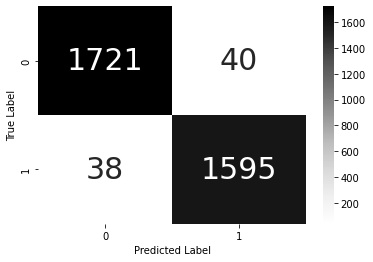

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sn

sn.heatmap(cf, annot=True, cmap="Greys",fmt='g', cbar=True, annot_kws={"size": 30})
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

## RFC

In [ ]:
y_pred3 = model3.predict(X2)

In [ ]:
y2

array([0, 0, 0, ..., 1, 1, 1])

In [ ]:
y_pred3

array([0, 0, 0, ..., 1, 1, 1])

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report

print("Accuracy: {}".format(accuracy_score(y2, y_pred3)))
print("Precision: ",str(precision_score(y2, y_pred3)))
print("Recall: " + str(recall_score(y2, y_pred3)))
print("F1-micro: " + str(f1_score(y2, y_pred3, average='micro')))
print("F1-macro: " + str(f1_score(y2, y_pred3, average='macro')))

cf = confusion_matrix(y2, y_pred3)
cr = classification_report(y2, y_pred3)

Accuracy: 0.9484384207424867
Precision:  0.9263157894736842
Recall: 0.969993876301286
F1-micro: 0.9484384207424867
F1-macro: 0.9484267757031459


In [ ]:
print(cr)

              precision    recall  f1-score   support

           0       0.97      0.93      0.95      1761
           1       0.93      0.97      0.95      1633

    accuracy                           0.95      3394
   macro avg       0.95      0.95      0.95      3394
weighted avg       0.95      0.95      0.95      3394



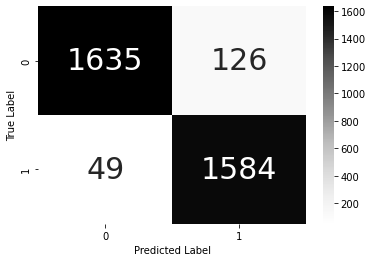

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sn

sn.heatmap(cf, annot=True, cmap="Greys",fmt='g', cbar=True, annot_kws={"size": 30})
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

## CNN

In [ ]:
y_pred4 = model.predict(X4)
predicted = np.argmax(y_pred4, axis=-1)
accuracy = np.equal(y4, predicted).mean()
print("Accuracy:", accuracy)

Accuracy: 0.9776075427224514


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y4, predicted))

              precision    recall  f1-score   support

         0.0       0.98      0.97      0.98      1761
         1.0       0.97      0.98      0.98      1633

    accuracy                           0.98      3394
   macro avg       0.98      0.98      0.98      3394
weighted avg       0.98      0.98      0.98      3394



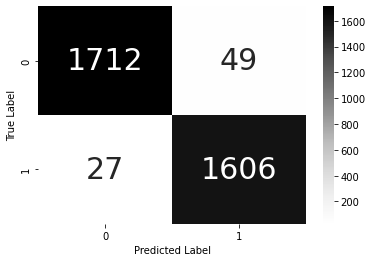

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sn
cf = confusion_matrix(y4, predicted)
sn.heatmap(cf, annot=True, cmap="Greys",fmt='g', cbar=True, annot_kws={"size": 30})
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# Kiểm Tra

## CNN

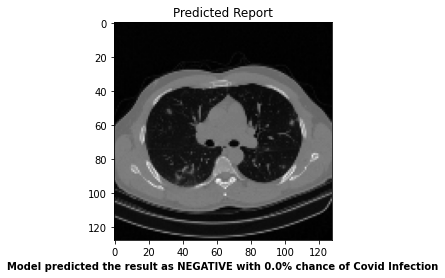

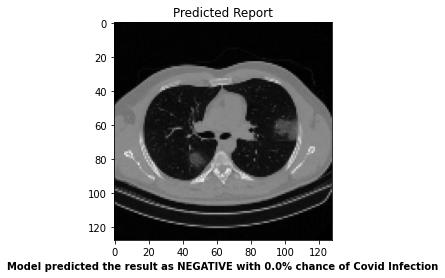

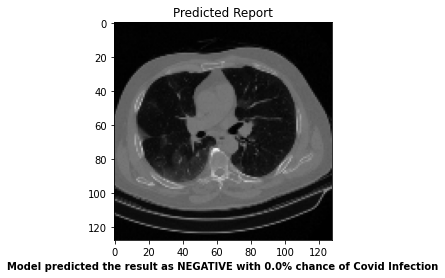

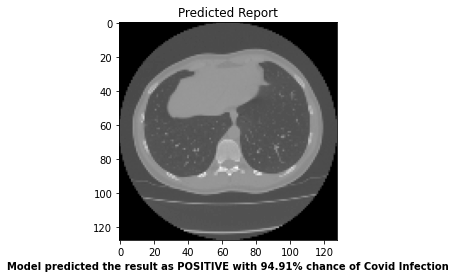

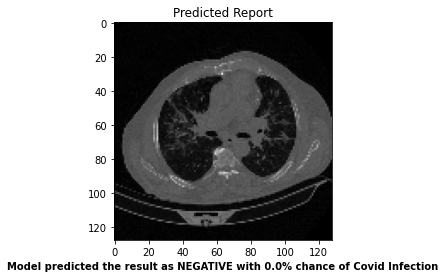

...

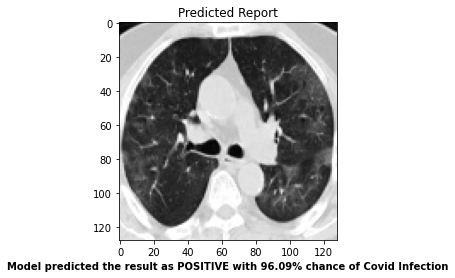

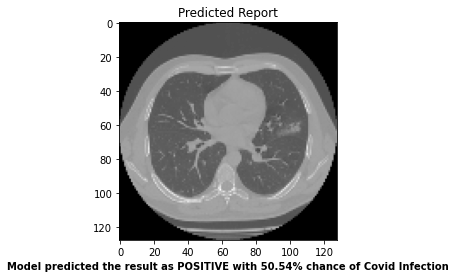

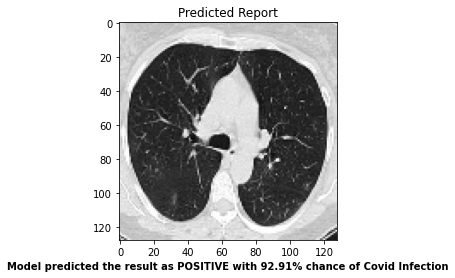

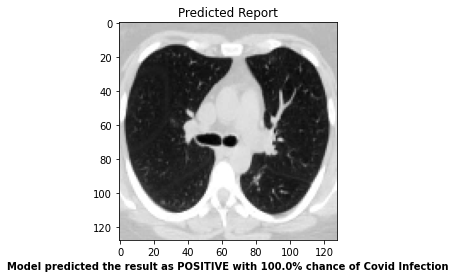

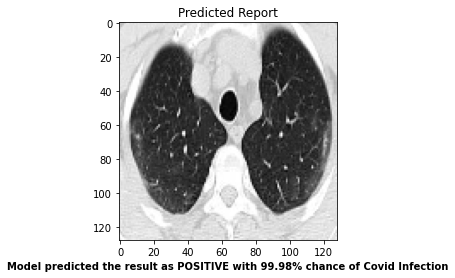

In [ ]:
# To print the final report
j = 0
k = 0
for i, label in enumerate(y_pred4):

    # Report for positive predicted cases
    if (np.argmax(y_pred4[i]) == 1.0) and (j < 10):
        plt.title("Predicted Report")
        plt.imshow(X4[i].squeeze(), cmap="gray")
        plt.xlabel(
            "Model predicted the result as POSITIVE with "
            + str(round((np.max(label) * 100), 2))
            + "% chance of Covid Infection",
            fontweight="bold",
        )

        plt.show()
        j = j + 1

    # Report for negative predicted cases
    if (np.argmax(y_pred4[i]) == 0.0) and (k < 10):
        plt.title("Predicted Report")
        plt.imshow(X4[i].squeeze(), cmap="gray")
        plt.xlabel(
            "Model predicted the result as NEGATIVE with "
            + str(round((np.min(label) * 100), 2))
            + "% chance of Covid Infection",
            fontweight="bold",
        )
        plt.show()
        k = k + 1

In [ ]:

error_indexes = []
for i in range(0, len(predicted)):
    if y4[i] != predicted[i]:
        error_indexes.append(i)

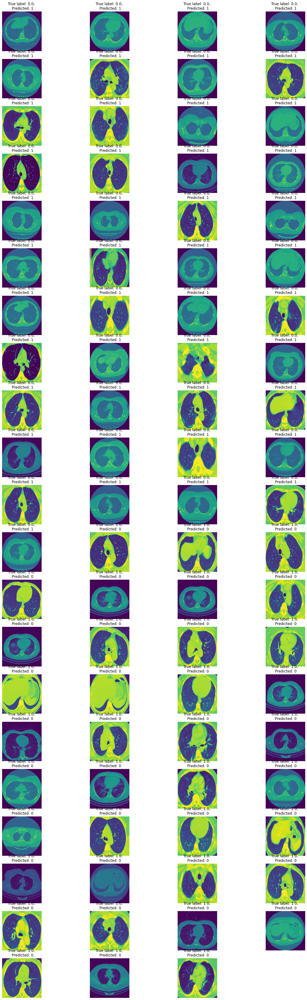

In [ ]:

plt.figure(figsize=(20, 120))
l_er= len(error_indexes)
ncols = 4
nrows = l_er//4 if l_er%ncols==0 else l_er//4+1
cnt=0
for i in error_indexes:
    cnt+=1
    ax = plt.subplot(nrows, ncols, cnt)
    # plt.imshow(np.squeeze(images[i].numpy().astype("uint8")))
    plt.imshow(np.squeeze(X4[i]))
    plt.title("True label: {}, \n Predicted: {}".format(([y4[i]])[0], ([predicted[i]])[0]))
    plt.axis("off")

## RFC

In [ ]:
error_indexes = []
for i in range(0, len(y2)):
    if y2[i] != y_pred3[i]:
        error_indexes.append(i)

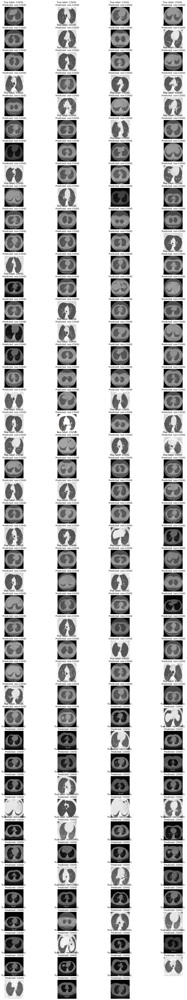

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20, 100))
l_er= len(error_indexes)
ncols = 4
nrows = l_er//4 if l_er%ncols==0 else l_er//4+1
cnt=0
for i in error_indexes:
    cnt+=1
    ax = plt.subplot(nrows, ncols, cnt)
    # plt.imshow(np.squeeze(images[i].numpy().astype("uint8")))
    plt.imshow(X_test[i])
    plt.title("True label: {}, \n Predicted: {}".format(le.inverse_transform([y2[i]])[0], le.inverse_transform([y_pred3[i]])[0]))
    plt.axis("off")

## KNN

In [ ]:
error_indexes = []
for i in range(0, len(y2)):
    if y2[i] != y_pred2[i]:
        error_indexes.append(i)

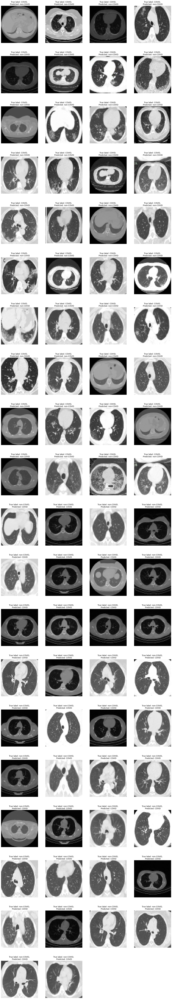

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20, 120))
l_er= len(error_indexes)
ncols = 4
nrows = l_er//4 if l_er%ncols==0 else l_er//4+1
cnt=0
for i in error_indexes:
    cnt+=1
    ax = plt.subplot(nrows, ncols, cnt)
    # plt.imshow(np.squeeze(images[i].numpy().astype("uint8")))
    plt.imshow(X_test[i])
    plt.title("True label: {}, \n Predicted: {}".format(le.inverse_transform([y2[i]])[0], le.inverse_transform([y_pred2[i]])[0]))
    plt.axis("off")

## LR

In [ ]:
error_indexes = []
for i in range(0, len(y2)):
    if y2[i] != y_pred1[i]:
        error_indexes.append(i)

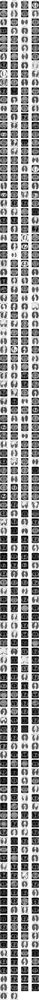

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20, 500))
l_er= len(error_indexes)
ncols = 4
nrows = l_er//4 if l_er%ncols==0 else l_er//4+1
cnt=0
for i in error_indexes:
    cnt+=1
    ax = plt.subplot(nrows, ncols, cnt)
    # plt.imshow(np.squeeze(images[i].numpy().astype("uint8")))
    plt.imshow(X_test[i])
    plt.title("True label: {}, \n Predicted: {}".format(le.inverse_transform([y2[i]])[0], le.inverse_transform([y_pred1[i]])[0]))
    plt.axis("off")

# Save model

## CNN

In [ ]:
!mkdir -p saved_model
model.save('/content/drive/MyDrive/Wibu/')

INFO:tensorflow:Assets written to: /content/drive/MyDrive/Wibu/assets
